# Processing with pIMOS

This parses straight from raw files to Process Level 1 - i.e. skips process level 0.

Included instruments:
- SBE56
- SBE39 T
- SBE39 TP
- SBE37 CTD 
- Our very special friend, SBE37 4567 CT
- Wetlabs
- Signature
- Vector
- TRDI ADCPS


In [1]:
import zutils.file as zfile

import pIMOS.xrwrap.seabird_37_39_56 as seabird_37_39_56
import pIMOS.xrwrap.wetlabs_ntu as wetlabs_ntu
import pIMOS.xrwrap.nortek_signature as nortek_signature
import pIMOS.xrwrap.nortek_vector as nortek_vector #, num2date_lk

import pIMOS.utils.UWA_archive_utils as ai 

import os
import matplotlib.pyplot as plt
import datetime
import numpy as np 
import pandas as pd
import glob

import pIMOS.utils.quality_control as pqc
import importlib

# O Drive is //drive.irds.uwa.edu.au/CEME-BBL-001
# pIMOS_export_dir = r'O:\Data\pIMOS\KISSME'

project_root = r'G:\Experiments\rs19'
project_root = r'E:\Experiments\rs19'

archive_dir = os.path.join(project_root, 'archive_FV00') 
moored_data_root = os.path.join(project_root, 'data/moored_instrument_data') 

dbconfig_file = os.path.join('./', 'database', 'config.txt') 

if not os.path.exists(archive_dir):
    os.mkdir(archive_dir)
    
db_config = ai.parse_dbconfig(dbconfig_file)
db_data = ai.read_db(dbconfig_file)
db_config
db_data


<class 'datetime.datetime'>
Module tested
<class 'datetime.datetime'>
Time vector is well spaced
<class 'numpy.datetime64'>
Time vector is well spaced
There are 101 elements in this 10 second period spaced at 0.1.
Time Module OK
[[ 6.123234e-17 -1.000000e+00  0.000000e+00]
 [ 1.000000e+00  6.123234e-17  0.000000e+00]
 [ 0.000000e+00  0.000000e+00  1.000000e+00]]
Time vector is well spaced
Time vector is well spaced
There are 101 elements in this 10 second period spaced at 0.1.
Time Module OK
deployment_metadata = ROWLEY_Instruments.csv

ctd_log = ROWLEY_CTD_Logbook.csv

possible_mooring_dates = ROWLEY_possible_mooring_dates.csv
deployment_metadata = ROWLEY_Instruments.csv

ctd_log = ROWLEY_CTD_Logbook.csv

possible_mooring_dates = ROWLEY_possible_mooring_dates.csv


c:\users\azulberti\dropbox\university\phd\03_code\source_code\turbo_tools\turbo_tools\utils\time.py:182: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  ans = linspacetime(pd.datetime.today(), pd.datetime.today()+datetime.timedelta(1), n=100)
c:\users\azulberti\dropbox\university\phd\03_code\source_code\turbo_tools\turbo_tools\utils\time.py:189: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  ans = linspacetime(pd.datetime.today(), pd.datetime.today()+dt, dt_s=dt_s)
c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\time.py:217: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  ans = linspacetime(pd.datetime.today(), pd.datetime.today()+datetime.timedelta(1), n=100)
c:\us

{'deployment_metadata':     Project StationID Trip Recovered  Longitude  Latitude  Depth TimeZone  \
 0    RS2019      T330       RS19_REC  118.98713 -17.77761    331      UTC   
 1    RS2019      T330       RS19_REC  118.98713 -17.77761    331      UTC   
 2    RS2019      T330       RS19_REC  118.98713 -17.77761    331      UTC   
 3    RS2019      T330       RS19_REC  118.98713 -17.77761    331      UTC   
 4    RS2019      T330       RS19_REC  118.98713 -17.77761    331      UTC   
 ..      ...       ...            ...        ...       ...    ...      ...   
 105  RS2019      L150       RS19_REC  119.17110 -18.00990    150      UTC   
 106  RS2019      L150       RS19_REC  119.17110 -18.00990    150      UTC   
 107  RS2019      L150       RS19_REC  119.17110 -18.00990    150      UTC   
 108  RS2019      L150       RS19_REC  119.17110 -18.00990    150      UTC   
 109  RS2019      L150       RS19_REC  119.17110 -18.00990    150      UTC   
 
               Site  InstrumentDepth   

# Loop through all now using the spreadsheet

In [9]:
moorings = db_data['possible_mooring_dates']['Mooring'].values
moorings

array(['l150', 't150', 't200', 't330'], dtype=object)

# Now the Wetlabs

No device file for 108, skipping
No device file for 107, skipping
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\NTU\2535_20190423.log
E:\Experiments\rs19\FLNTU_DEVICE_FILES\2535\FLNTUSB-2535.dev
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "2535_20190423.log"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\NTU"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '2535_20190423.log', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\NTU', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory':

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 3 values.


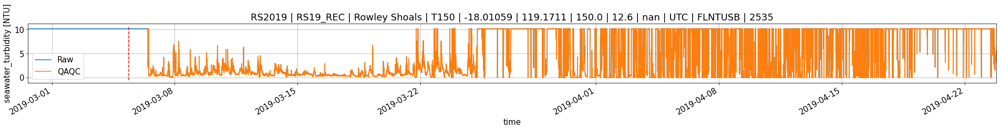

whoa: 1835
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\NTU\1835_20190423.log
E:\Experiments\rs19\FLNTU_DEVICE_FILES\1835\FLNTUSB-1835(NTU).dev
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "1835_20190423.log"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\NTU"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '1835_20190423.log', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\NTU', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directo

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


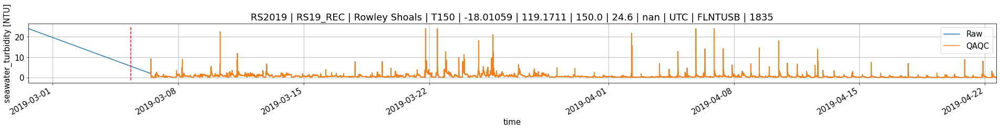

File column empty, skipping.
File column empty, skipping.
No device file for 122, skipping


In [3]:

filetypes = ['FLNTUSB', 'NTU'];

# dfd = r'G:\Experiments\kissme17\Data\FLNTU\Device Files'
# dfd = r'E:\Experiments\rs19\FLNTU_DEVICE_FILES'

for index, row in db_data['deployment_metadata'].iterrows():

    mooring = row['StationID'].strip().lower()
    instrument = row['InstrumentType'].strip()
    sn = row['SerialNo'].strip()
    attributes = ai.row_to_attrs(row)
    
    if not mooring.lower() in moorings:
        print('Skipping ' + mooring)
        continue

    if instrument in filetypes:

        if not type(row['FileName'])==str:
            print('File column empty, skipping.')
            continue  
        
        filename = os.path.join(moored_data_root, row['FilePath'], row['FileName'])
        folder_df = os.path.join(project_root, 'FLNTU_DEVICE_FILES', str(sn))
        
        dfn = glob.glob(folder_df+'/*.dev')
        
        if len(dfn)==0:
            print('No device file for {}, skipping'.format(str(sn)))
            continue
        elif not len(dfn)==1:
            print('whoa: {}'.format(str(sn)))
            dfn = [i for i in dfn if '(NTU)' in os.path.split(i)[1]]
        else:
            pass

        dfn = dfn[0]
        print(filename)
        print(dfn)
        
        rr, ds = wetlabs_ntu.from_log(filename)
        rr._calibrate_device(dfn)
        
        rr.update_attributes_with_dict(attributes)

        pqc.pimosInOutWaterQC(rr, mooring, db_data, experiment='rs2019', recovered='rs19_rec')
                
        ai.pIMOS_export(rr, archive_dir, instrument, sn)
        fig = ai.plot_temp(rr, db_data, mooring, attributes, variable='turbidity', plotraw=True)
        
        png_path = rr.fullpath_last_export[0:-3] +'.png'
        fig.savefig(png_path, dpi=300)
        

### Start with the SEABIRD data files that load from ascs

In [13]:
import xarray as xr 

ds = xr.open_dataset(r'E:\Experiments\rs19\archive_FV00\SBE56\[RS2019]_[RS19_REC]_[T150]_[290]_[SBE56 T ]_[7372]_[].nc')
ds = xr.open_dataset(r'E:\Experiments\rs19\archive_FV00\SBE56\[RS2019]_[RS19_REC]_[T200]_[1500]_[SBE56 T ]_[7400]_[].nc')
ds = xr.open_dataset(r'E:\Experiments\rs19\archive_FV00\SBE56\[RS2019]_[RS19_REC]_[T330]_[19000]_[SBE56 T ]_[781]_[].nc')

%matplotlib
ds.Temperature.plot()

Using matplotlib backend: Qt5Agg


In [16]:
%matplotlib inline 


E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_4455_20190424_cleaned.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_4455_20190424_cleaned.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_4455_20190424_cleaned.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


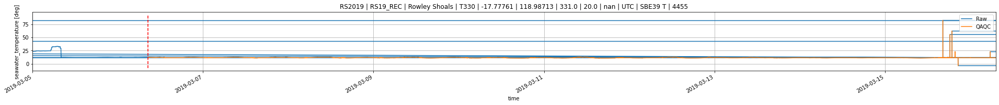

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3753_20190425.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3753_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3753_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


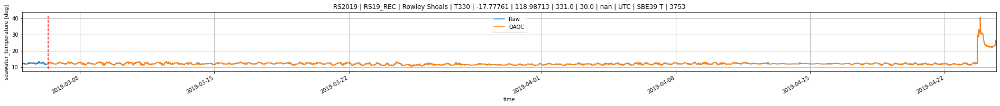

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3752_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3752_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3752_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


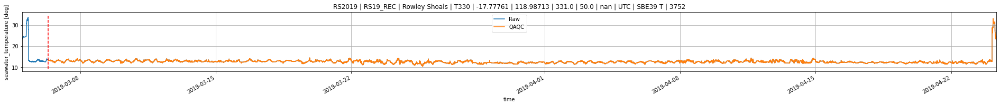

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3750_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3750_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3750_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


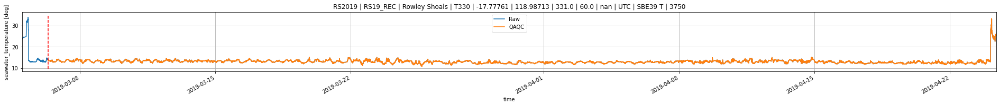

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3749_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3749_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3749_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


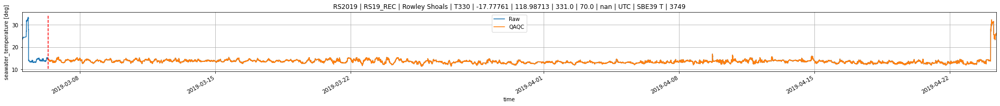

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3747_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3747_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3747_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


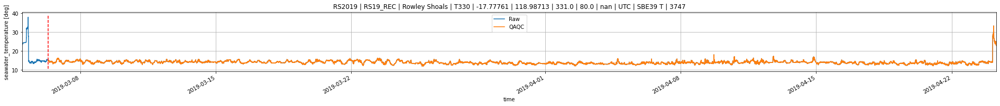

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3731_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3731_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3731_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


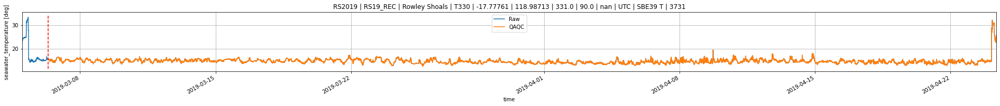

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3730_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3730_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3730_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


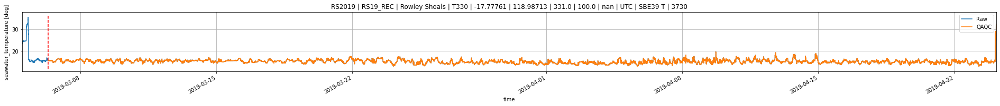

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3729_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3729_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3729_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


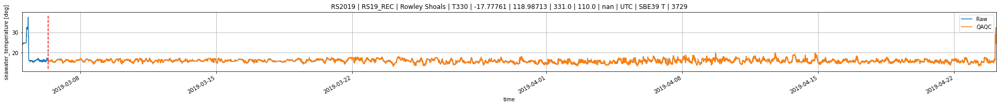

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_4456_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_4456_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_4456_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


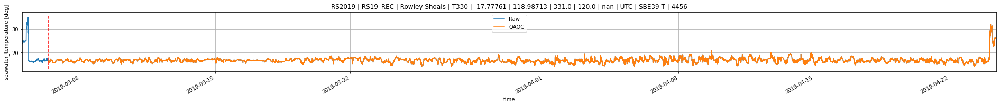

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3723_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3723_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3723_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


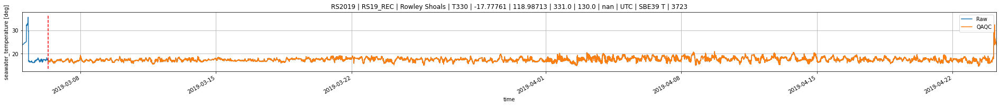

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_6527_20190424.asc
File exists
asc file appears to be for an SBE39...
temperature and pressure
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_6527_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_6527_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'las

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


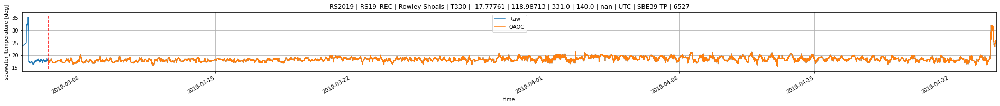

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3728_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3728_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3728_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


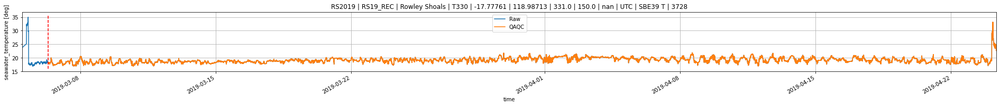

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3727_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3727_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3727_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


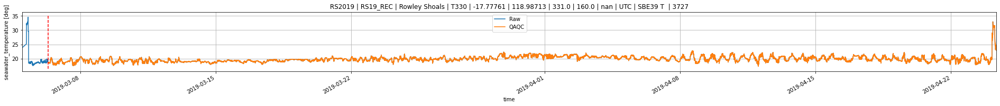

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3726_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3726_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3726_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


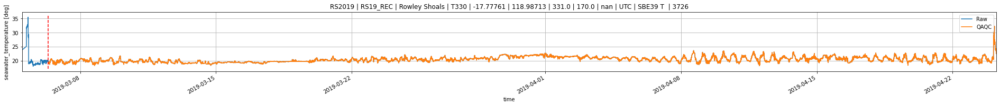

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3725_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3725_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3725_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


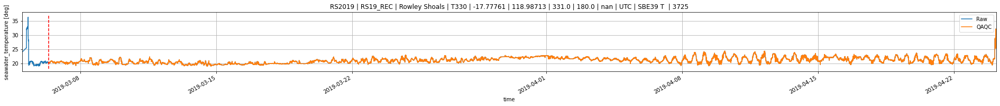

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_6528_20190424.asc
File exists
asc file appears to be for an SBE39...
temperature and pressure
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_6528_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_6528_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'las

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


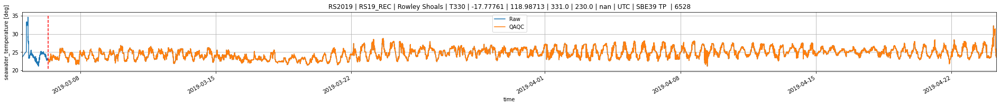

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3724_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3724_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3724_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


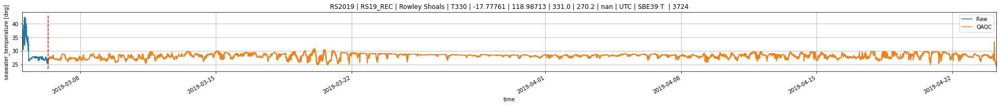

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3722_20190425.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3722_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3722_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


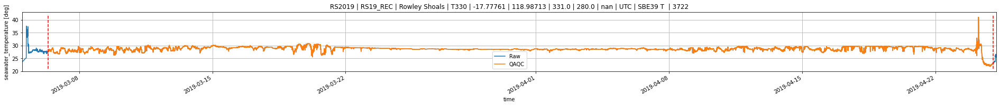

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3721_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3721_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3721_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


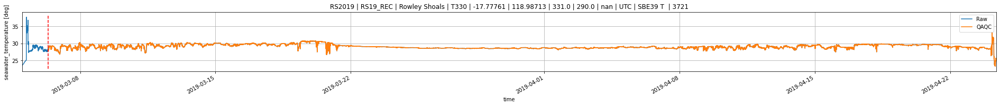

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_3719_20190424.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3719_20190424.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3719_20190424.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


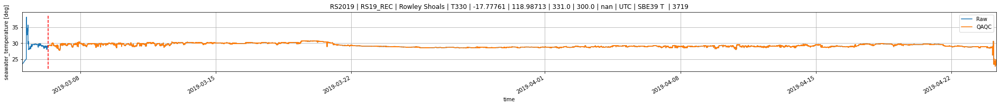

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\39_6523_20190425.asc
File exists
asc file appears to be for an SBE39...
temperature and pressure
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_6523_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_6523_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T330\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'las

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


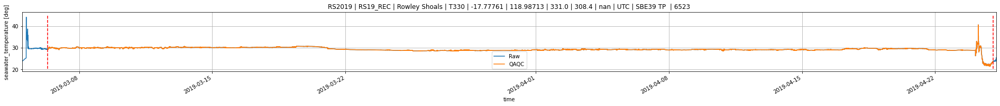

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_4454_20190425.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_4454_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_4454_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


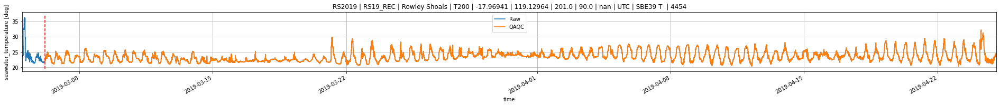

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_6530_20190425.asc
File exists
asc file appears to be for an SBE39...
temperature and pressure
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_6530_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_6530_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'las

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


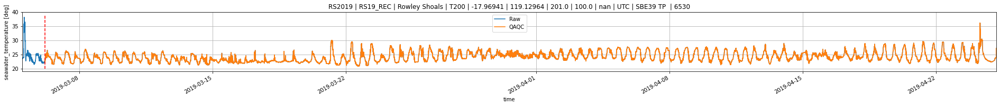

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_4453_20190425.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_4453_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_4453_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


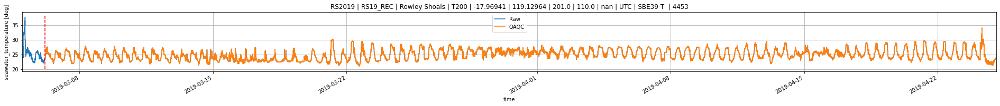

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_4452_20190425.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_4452_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_4452_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


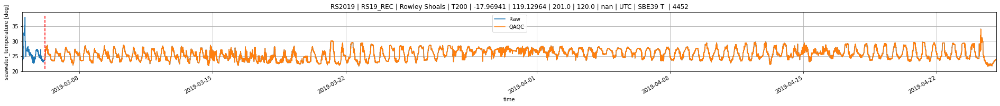

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_3975_20190425.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3975_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3975_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


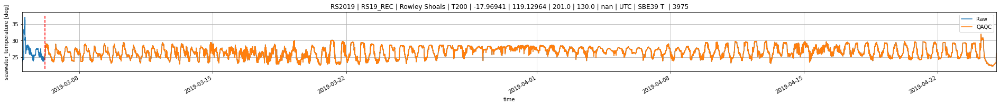

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_6529_20190425.asc
File exists
asc file appears to be for an SBE39...
temperature and pressure
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_6529_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_6529_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'las

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


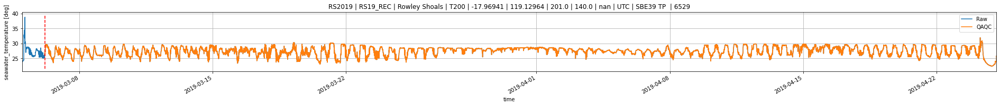

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_3799_20190425.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3799_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3799_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


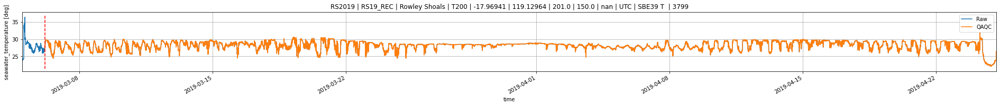

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_3798_20190425.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3798_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3798_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


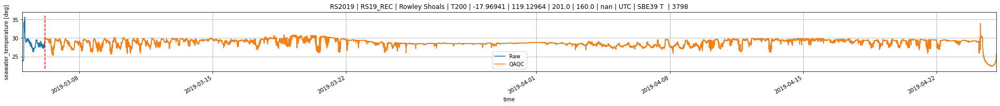

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_3754_20190425.asc
File exists
asc file appears to be for an SBE39...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_3754_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_3754_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'last_load_directory': '', 'o

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


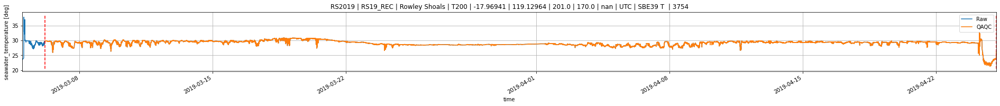

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39\39_6526_20190425.asc
File exists
asc file appears to be for an SBE39...
temperature and pressure
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_6526_20190425.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_6526_20190425.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'las

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


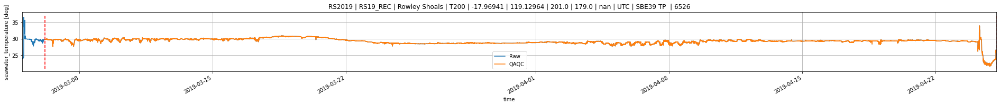

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE39\SBE39plus08223_2019-04-23_cleaned.asc
File exists
asc file appears to be for an SBE37...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE39plus08223_2019-04-23_cleaned.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE39plus08223_2019-04-23_cleaned.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 0 values.


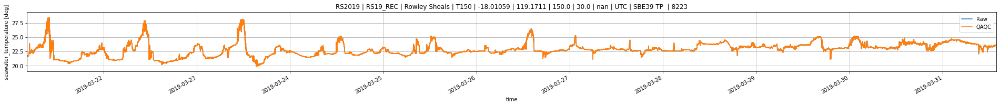

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE39\39_5082_20190423.asc
File exists
asc file appears to be for an SBE39...
temperature and pressure
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "39_5082_20190423.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': '39_5082_20190423.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'las

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


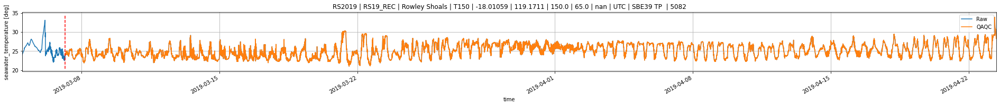

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE39\SBE39plus06617_2019-04-25.asc
File exists
asc file appears to be for an SBE39...
temperature and pressure
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE39plus06617_2019-04-25.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE39plus06617_2019-04-25.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'las

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


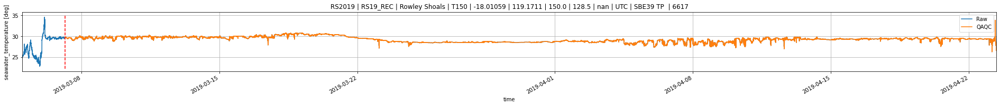

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\SBE39\SBE39plus08222_2019-04-25.asc
File exists
asc file appears to be for an SBE37...
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE39plus08222_2019-04-25.asc"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\SBE39"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE39plus08222_2019-04-25.asc', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\L150\\SBE39', 'raw_file_attributes': '', 'last_export_file_name': '', 'last_export_directory': '', 'last_load_file_name': '', 'l

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE39
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE39//[RS2019]_[RS19_REC]_[L150]_[1000]_[SBE39 TP ]_[8222]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 953003 values.


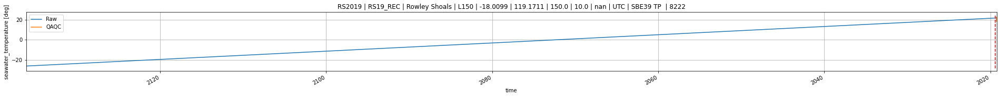

In [17]:
# csvfile = os.path.join(db_config['db_root'], db_config['db_csv'])
# os.path.exists(csvfile)
importlib.reload(ai)

filetypes = ['SBE39 TP', 'SBE39 T', 'SBE39-ext T', 'SBE37 CT'];
moorings = db_data['possible_mooring_dates']['Mooring'].values

df = db_data['deployment_metadata']
# df = df.loc[df['SerialNo']==3799]

for index, row in df.iterrows():
#     line = line.split(',')

    mooring = row['StationID'].strip()
    instrument = row['InstrumentType'].strip()
    sn = row['SerialNo'].strip()

    attributes = ai.row_to_attrs(row)

    if not mooring.lower() in moorings:
        print('Skipping ' + mooring)
        continue

    if instrument in ['SBE39 TP', 'SBE39 T', 'SBE39-ext T']:
        
        if not type(row['FileName'])==str:
            print('File column empty, skipping.')
            continue  

        asc_filename = os.path.join(moored_data_root, row['FilePath'], row['FileName'])
        print(asc_filename)

        if os.path.exists(asc_filename):
            print('File exists')
        else:
            print('File does not exist')
#             raise(Exception)
            continue

#             mcout_asc = read_sbd.parse_seabird_asc(asc_filename)

        folder, file = os.path.split(asc_filename)
        rr, ds = seabird_37_39_56.from_asc(asc_filename)

        rr.update_attributes_with_dict(attributes)

#         ai.qc_impossible_date(rr, mooring, db_data, year_1=1890)
        pqc.pimosInOutWaterQC(rr, mooring, db_data, year_1=1890, experiment='rs2019', recovered='rs19_rec')

        ai.pIMOS_export(rr, archive_dir, instrument[0:5], sn)
        fig = ai.plot_temp(rr, db_data, mooring, attributes)
        
        png_path = rr.fullpath_last_export[0:-3] +'.png'
        fig.savefig(png_path, dpi=300)
                        

### Now the SEABIRD data files that load from cnvs

E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56\SBE05607374_2019-04-24
File does not exist
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE37\SBE37SM-RS232_03712739_2019_04_24.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE37\SBE37SM-RS232_03712739_2019_04_24.cnv...
No lat/lon stored.
Time code timeJV2
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE37SM-RS232_03712739_2019_04_24.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE37"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 0 values.


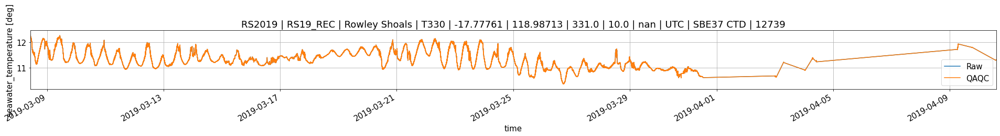

E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56\SBE05607403_2019-04-24.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56\SBE05607403_2019-04-24.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607403_2019-04-24.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607403_2019-04-24.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data/T330/SBE56', 'raw_file_attributes': '', '

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 61154 values.


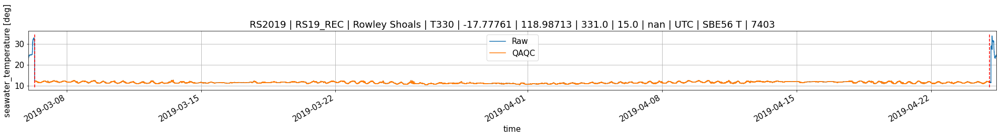

E:\Experiments\rs19\data/moored_instrument_data\aw_data\T330\SBE37\SBE37SM-RS232_03712738_2019_04_24.cnv
File does not exist
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\SBE05600781_2019-04-24.cnv
File does not exist
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\SBE05600725_2019-04-24.cnv
File does not exist
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE39\SBE05600711_2019-05-13.cnv
File does not exist
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE37\SBE37SM-RS232_03709276_2019_04_24.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE37\SBE37SM-RS232_03709276_2019_04_24.cnv...
No lat/lon stored.
Time code timeJV2
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE37SM-RS232_03709276_2019_04_24.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\SBE37"
{'title

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 0 values.


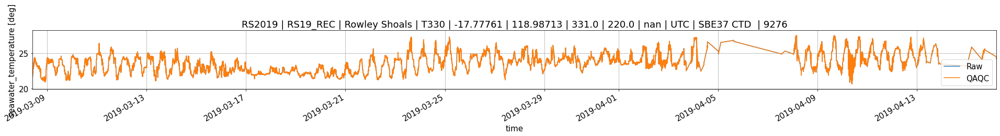

E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56\SBE05600879_2019-04-24.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56\SBE05600879_2019-04-24.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05600879_2019-04-24.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05600879_2019-04-24.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data/T330/SBE56', 'raw_file_attributes': '', '

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 53858 values.


C:\Users\AZulberti\.conda\envs\pIMOS_test\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


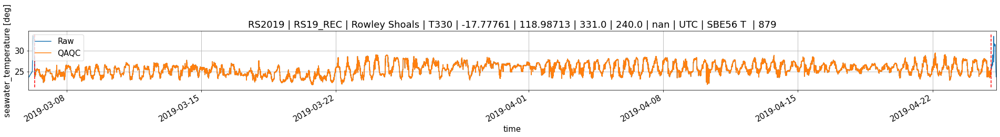

<ipython-input-2-654deb454b8b>:47: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(png_path + '.png', dpi=300)


E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56\SBE05600878_2019-04-24.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56\SBE05600878_2019-04-24.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05600878_2019-04-24.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05600878_2019-04-24.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data/T330/SBE56', 'raw_file_attributes': '', '

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 56157 values.


C:\Users\AZulberti\.conda\envs\pIMOS_test\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


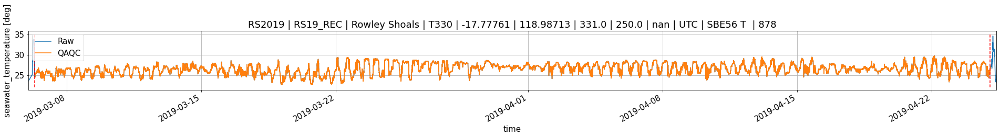

E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56\SBE05600877_2019-04-24.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56\SBE05600877_2019-04-24.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05600877_2019-04-24.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data/T330/SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05600877_2019-04-24.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data/T330/SBE56', 'raw_file_attributes': '', '

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 58923 values.


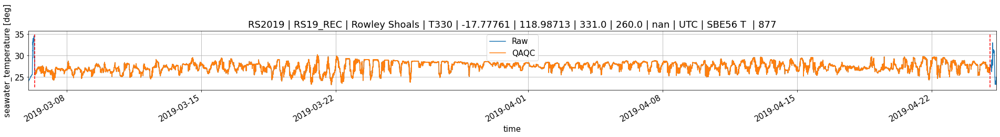

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05607401_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05607401_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607401_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607401_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T200]_[290]_[SBE56 T ]_[7401]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 114091 values.


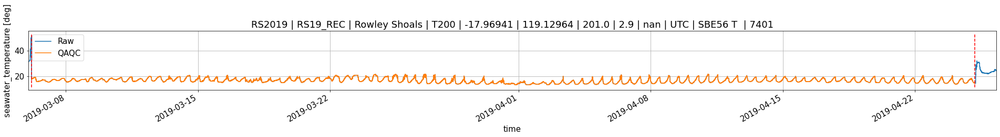

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE37\SBE37SM-RS232_03711063_2019_04_24.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE37\SBE37SM-RS232_03711063_2019_04_24.cnv...
No lat/lon stored.
Time code timeJV2
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE37SM-RS232_03711063_2019_04_24.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE37"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE37SM-RS232_03711063_2019_04_24.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instr

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 1695 values.


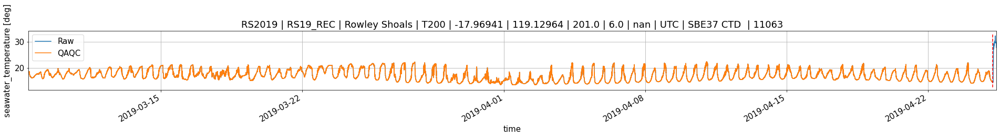

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05602978_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05602978_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05602978_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05602978_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T200]_[1000]_[SBE56 T ]_[2978]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 109336 values.


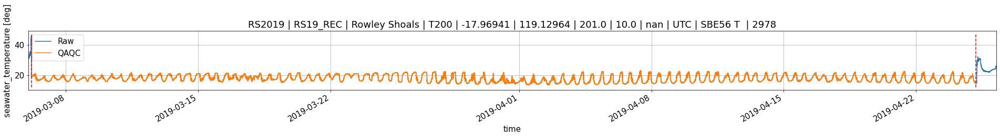

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05607400_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05607400_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607400_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607400_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T200]_[1500]_[SBE56 T ]_[7400]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 108034 values.


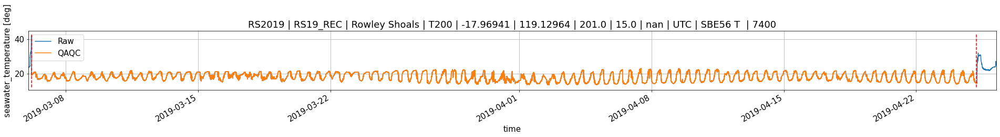

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05602977_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05602977_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05602977_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05602977_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 111502 values.


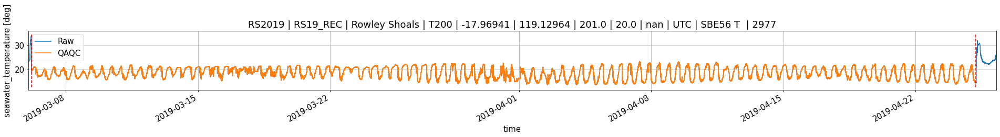

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05607402_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05607402_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607402_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607402_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 114336 values.


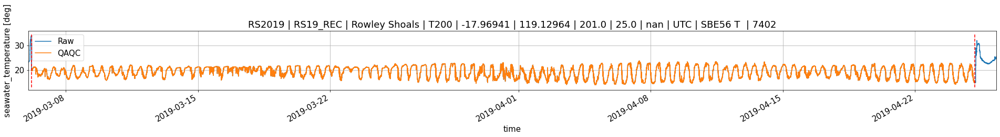

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05602976_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05602976_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05602976_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05602976_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 104671 values.


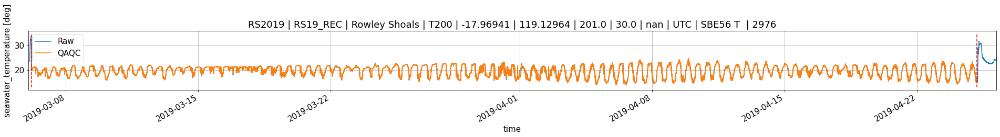

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05602975_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05602975_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05602975_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05602975_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 109268 values.


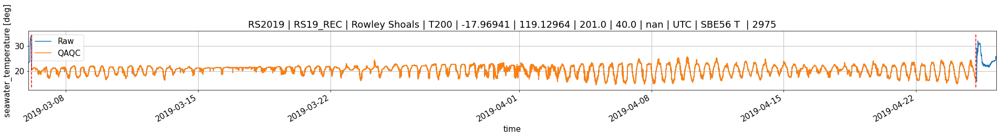

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05600912_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05600912_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05600912_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05600912_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 111227 values.


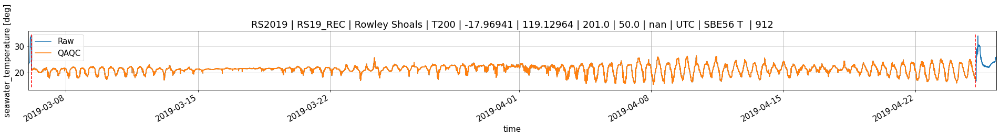

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05600910_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05600910_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05600910_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05600910_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 111549 values.


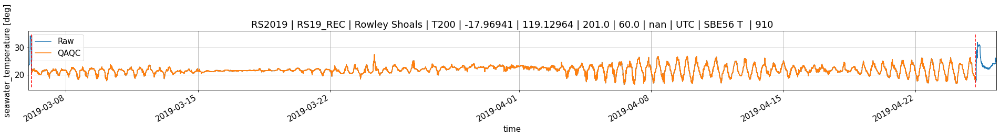

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05600909_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05600909_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05600909_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05600909_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 114163 values.


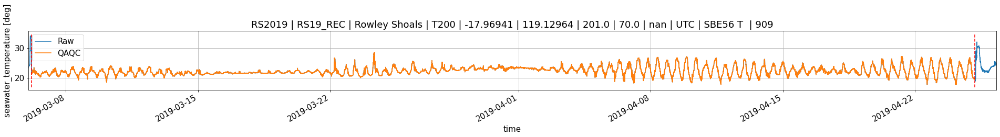

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05600908_2019-04-25.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56\SBE05600908_2019-04-25.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05600908_2019-04-25.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T200\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05600908_2019-04-25.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T200\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 102121 values.


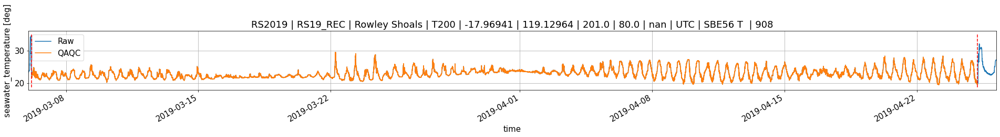

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607372_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607372_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607372_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607372_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 117157 values.


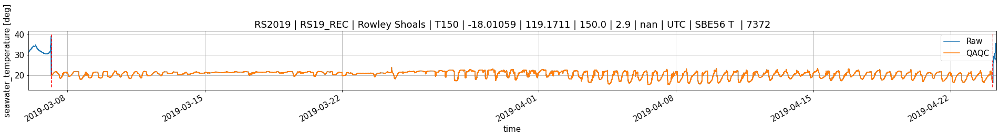

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE57\SBE05607371_2019-04-23.cnv
File does not exist
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607370_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607370_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607370_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607370_2019-04-23.cnv', 'raw_file_

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 115812 values.


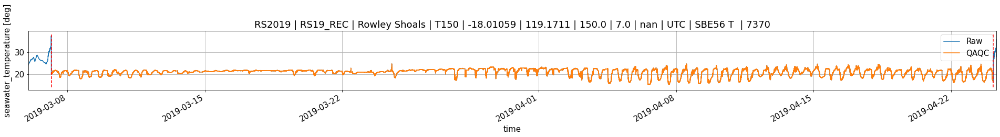

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE57\SBE05607369_2019-04-23.cnv
File does not exist
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE58\SBE05607347_2019-04-23.cnv
File does not exist
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607346_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607346_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607346_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': ''

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 119607 values.


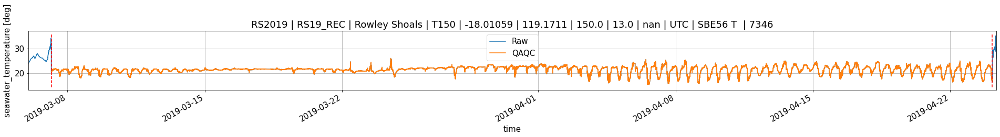

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607345_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607345_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607345_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607345_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 117078 values.


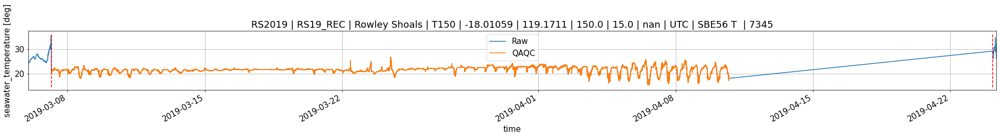

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607344_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607344_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607344_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607344_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T150]_[1700]_[SBE56 T ]_[7344]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 116168 values.


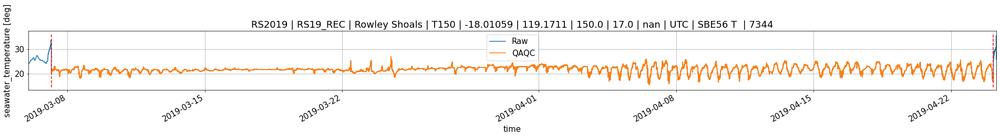

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607343_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607343_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607343_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607343_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T150]_[1900]_[SBE56 T ]_[7343]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 120606 values.


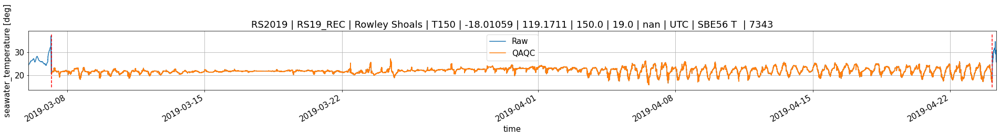

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607342_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607342_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607342_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607342_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 125891 values.


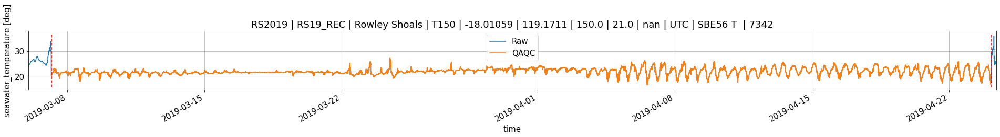

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607341_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607341_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607341_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607341_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 125339 values.


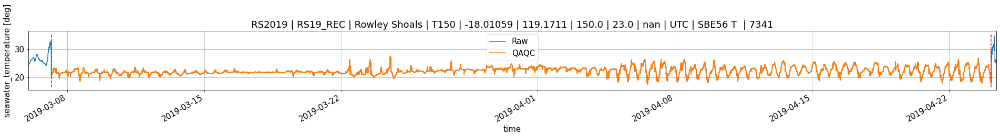

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607340_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607340_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607340_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607340_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 121858 values.


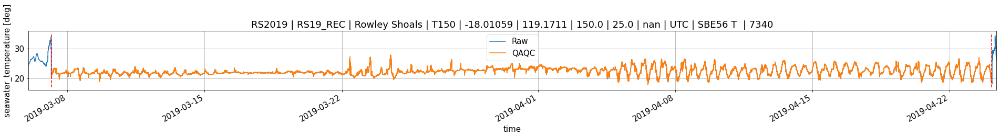

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607339_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607339_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607339_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607339_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 124059 values.


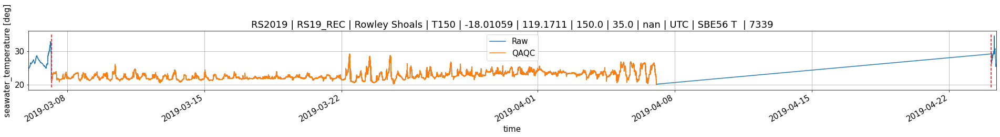

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607338_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607338_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607338_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607338_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 123471 values.


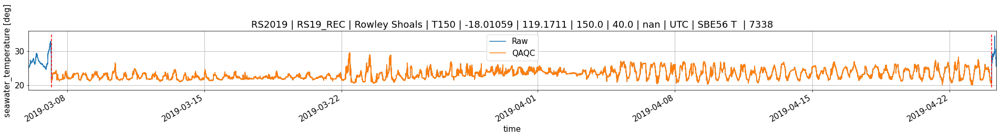

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607378_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607378_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607378_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607378_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T150]_[4500]_[SBE56 T ]_[7378]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 118548 values.


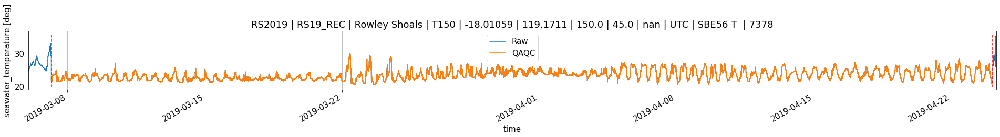

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607319_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607319_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607319_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607319_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 126799 values.


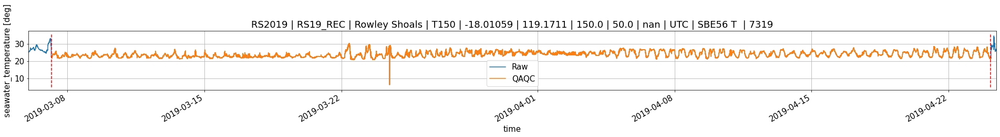

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607399_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607399_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607399_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607399_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T150]_[5500]_[SBE56 T ]_[7399]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 122422 values.


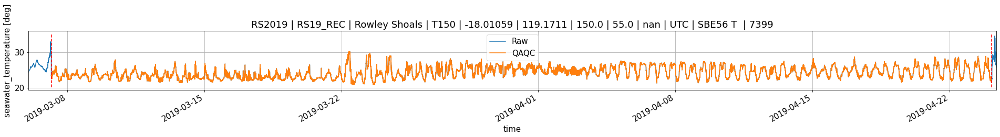

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607308_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607308_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607308_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607308_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Figure size is 69.0 x 8.0 cm
Blanking 121630 values.


C:\Users\AZulberti\.conda\envs\pIMOS_test\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


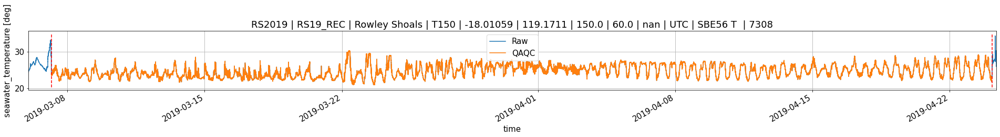

<ipython-input-2-654deb454b8b>:47: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(png_path + '.png', dpi=300)


E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607274_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05607274_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05607274_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05607274_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T150]_[7000]_[SBE56 T ]_[7274]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 121006 values.


C:\Users\AZulberti\.conda\envs\pIMOS_test\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


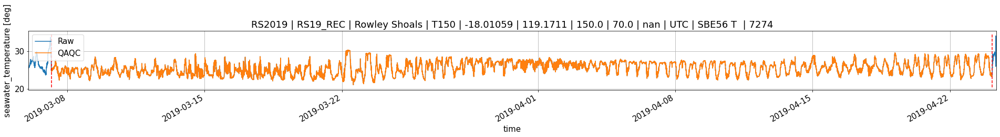

<ipython-input-2-654deb454b8b>:47: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(png_path + '.png', dpi=300)


E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05600674_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05600674_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05600674_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05600674_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T150]_[8000]_[SBE56 T ]_[674]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 122721 values.


C:\Users\AZulberti\.conda\envs\pIMOS_test\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


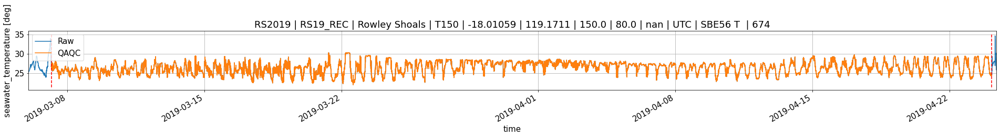

<ipython-input-2-654deb454b8b>:47: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(png_path + '.png', dpi=300)


E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05606965_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05606965_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05606965_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05606965_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T150]_[9000]_[SBE56 T ]_[6965]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 123612 values.


C:\Users\AZulberti\.conda\envs\pIMOS_test\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


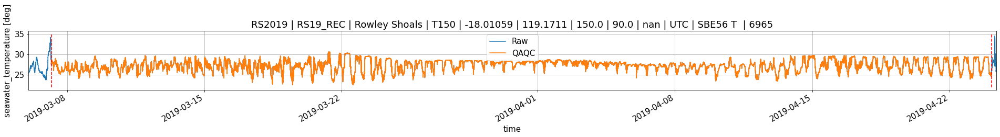

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05606964_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05606964_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05606964_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05606964_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56', 'raw_file_attributes': '',

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T150]_[10000]_[SBE56 T ]_[6964]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 124382 values.


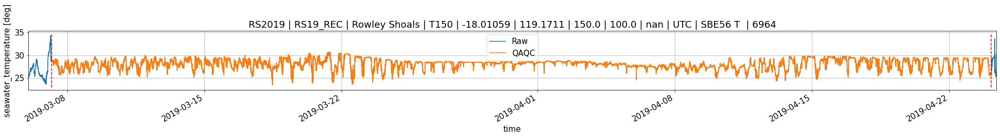

File column empty, skipping.
E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05602981_2019-04-23.cnv
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56\SBE05602981_2019-04-23.cnv...
No lat/lon stored.
Initialising accessor.
STORING RAW FILE ATTRIBUTES
Setting attribute "raw_file_name" to "SBE05602981_2019-04-23.cnv"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T150\SBE56"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '', 'raw_file_name': 'SBE05602981_2019-04-23.cnv', 'raw_file_directory': 'E:\\Experiments\\rs19\\data/moored_instrument_data\\raw_data\\T150\\SBE56

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1060: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


E:\Experiments\rs19\archive_FV00\SBE56
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\SBE56//[RS2019]_[RS19_REC]_[T150]_[12000]_[SBE56 T ]_[2981]_[].nc
Figure size is 69.0 x 8.0 cm
Blanking 126347 values.


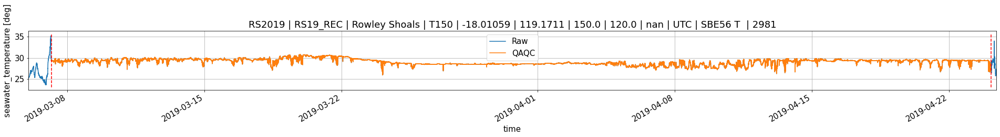

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\SBE56\SBE05600907_2019-04-25.xml
File exists
Reading CNV file:
	E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\SBE56\SBE05600907_2019-04-25.xml...


RuntimeError: end of header not found

In [2]:
# raise(Exception('This must be converted to the Pandas Dataframe, not csvread.'))
# os.path.exists(csvfile)

filetypes = ['SBE56 T', 'SBE37 CTD'];
moorings = db_data['possible_mooring_dates']['Mooring'].values

for index, row in db_data['deployment_metadata'].iterrows():

    mooring = row['StationID'].strip()
    instrument = row['InstrumentType'].strip()
    sn = row['SerialNo'].strip()
    
    attributes = ai.row_to_attrs(row)
    
    if not mooring.lower() in moorings:
        print('Skipping ' + mooring)
        continue

    if instrument in filetypes:

        if not type(row['FileName'])==str:
            print('File column empty, skipping.')
            continue 
            
        asc_filename = os.path.join(moored_data_root, row['FilePath'], row['FileName'])
        print(asc_filename)

        if os.path.exists(asc_filename):
            print('File exists')
        else:
            print('File does not exist')
#             raise(Exception)
            continue

#             mcout_asc = read_sbd.parse_seabird_cnv(asc_filename)
        folder, file = os.path.split(asc_filename)
        rr, ds = seabird_37_39_56.from_cnv(asc_filename)
        rr.update_attributes_with_dict(attributes)

#         ai.qc_impossible_date(rr, mooring, db_data)
        pqc.pimosInOutWaterQC(rr, mooring, db_data, year_1=1890, experiment='rs2019', recovered='rs19_rec')

        ai.pIMOS_export(rr, archive_dir, instrument[0:5], sn)
        fig = ai.plot_temp(rr, db_data, mooring, attributes)
        
        png_path = rr.fullpath_last_export[0:-3] +'.png'
        fig.savefig(png_path + '.png', dpi=300)
        

# Now the TRDI instruments

In [2]:

import pIMOS.xrwrap.rdi_adcp as rdi_adcp 

filetypes = ['RDI 150 kHz Quartermaster', 'RDI 300 kHz Monitor', 'RDI75 kHz Longranger', 'RDI 300 kHz Sentinel', 'RDI 300 kHz Monitor'];
# filetypes = ['RDI 150 kHz Quartermaster'];
# filetypes = ['RDI75 kHz Longranger'];
moorings = db_data['possible_mooring_dates']['Mooring'].values

for index, row in db_data['deployment_metadata'].iterrows():

    mooring = row['StationID'].strip()
    instrument = row['InstrumentType'].strip()
    sn = row['SerialNo'].strip()
    
    attributes = ai.row_to_attrs(row)
        
    if not mooring.lower() in moorings:
        print('Skipping ' + mooring)
        continue

    if instrument in filetypes:

        pd0_filename = os.path.join(moored_data_root, row['FilePath'], row['FileName'])
        print(pd0_filename)

        if os.path.exists(pd0_filename):
            print('File exists')
        else:
            raise(Exception)

        rr, ds = rdi_adcp.from_pdo(pd0_filename, rotate=True, mapbins=True)

        rr.update_attributes_with_dict(attributes)

        pqc.pimosInOutWaterQC(rr, mooring, db_data, experiment='rs2019', recovered='rs19_rec')
        pqc.pimosTiltVelocitySimpleQC(rr)
        pqc.pimosEchoIntensitySimpleQC(rr, thresh_1=45)
        pqc.pimosErrorVelocitySetQC(rr)
        pqc.pimosCorrMagVelocitySetQC(rr)
        pqc.pimosPercentGoodVelocitySetRDIQC(rr)

        # Keep the sidelobe interference like this for now, not using the IMOS methods.
        if not type(row['SidelobeInt'])==str:
            pass # 
        elif row['SidelobeInt'].lower() == 'pressure':
            rr._calc_sidelobe_trim()
        elif row['SidelobeInt'].lower() == 'seabed':
            rr._calc_sidelobe_trim(attributes['nominal_instrument_height_asb'])
        elif row['SidelobeInt'].lower() == 'nominal_depth':
            nd = abs(attributes['nominal_instrument_height_asb']+attributes['nominal_site_depth'])
            print('ND: {}'.format(nd))
            rr._calc_sidelobe_trim(nd)
        else:
            raise(Exception("Not recognised"))
        
        ai.pIMOS_export(rr, archive_dir, instrument, sn)

        fig = ai.plot_temp(rr, db_data, mooring, attributes, variable='u',plotraw=False)

        png_path = rr.fullpath_last_export[0:-3] +'.png'
        fig.savefig(png_path, dpi=300)
        

E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\ADCP\T330_000.000
File exists

Reading file E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\ADCP\T330_000.000 ...
  Encountered end of file.  Cleaning up data.


c:\users\azulberti\dropbox\university\phd\03_code\source_code\pimos\pIMOS\xrwrap\rdi_adcp.py:50: UserWarning: WARNING: ADCP CODE PREPARED FOR BEAM COORDS ONLY.
  warnings.warn('WARNING: ADCP CODE PREPARED FOR BEAM COORDS ONLY.')


Initialising accessor.
STORING RAW FILE ATTRIBUTES
_TYPE
NAME
SOURCEPROG
PROG_VER
CONFIG
BEAM_ANGLE
NUMBEAMS
BEAM_FREQ_KHZ
BEAM_PATTERN
ORIENTATION
SIMFLAG
N_BEAM
N_CELLS
PINGS_PER_ENSEMBLE
CELL_SIZE_M
BLANK_M
PROF_MODE
CORR_THRESHOLD
PROF_CODEREPS
MIN_PGOOD
EVEL_THRESHOLD
SEC_BETWEEN_PING_GROUPS
COORD
COORD_SYS
USE_PITCHROLL
USE_3BEAM
BIN_MAPPING
XDUCER_MISALIGN_DEG
MAGNETIC_VAR_DEG
SENSORS_SRC
SENSORS_AVAIL
BIN1_DIST_M
XMIT_PULSE
WATER_REF_CELLS
FLS_TARGET_THRESHOLD
XMIT_LAG_M
Setting attribute "raw_file_name" to "T330_000.000"
Setting attribute "raw_file_directory" to "E:\Experiments\rs19\data/moored_instrument_data\raw_data\T330\ADCP"
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': '', 'history': '', 'references': '', 'comment': '', 'Conventions': 'CF-1.7', 'trip': '', 'trip_deployed': '', 'site': '', 'site_station': '', 'instrument_make': '', 'instrument_model': '', 'instrument_serial_number': '

c:\users\azulberti\dropbox\university\phd\03_code\source_code\pimos\pIMOS\xrwrap\rdi_adcp.py:326: UserWarning: ROTATION WARNING: Should do rotations from self.ds NOT self._data.
  warnings.warn('ROTATION WARNING: Should do rotations from self.ds NOT self._data.')


Re-mapping beam data...


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\AZulberti\.conda\envs\pIMOS_test\lib\site-packages\IPython\core\interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-3-460cd6c236f3>", line 30, in <module>
    rr, ds = rdi_adcp.from_pdo(pd0_filename, rotate=True, mapbins=True)
  File "c:\users\azulberti\dropbox\university\phd\03_code\source_code\pimos\pIMOS\xrwrap\rdi_adcp.py", line 183, in from_pdo
    rr._calc_rotations(mapbins)
  File "c:\users\azulberti\dropbox\university\phd\03_code\source_code\pimos\pIMOS\xrwrap\rdi_adcp.py", line 344, in _calc_rotations
    self._rotate_velocity(beamvel,
  File "c:\users\azulberti\dropbox\university\phd\03_code\source_code\pimos\pIMOS\xrwrap\rdi_adcp.py", line 548, in _rotate_velocity
    beamvelnew = rdi_adcp_utils.binmap(beamvel, distance, pitch_deg, roll_deg)
  File "c:\users\azulberti\dropbox\university\phd\03_code\source_code\pimos\pIMOS\utils\rdi_adcp_utils.py", line 48

TypeError: object of type 'NoneType' has no len()

# Now the Vectors

### Tilt fix
<!-- Vector 6019 had a tile issue. This needs to be corrected. The correction I calculated was:

pitch = 0.3349 \
roll  = 1.9945

I need a clean way to apply this - for now it will just be in an if statement. 

As for tracking, should we have a xrwrap function that applies offsets or defaults in the case of broken or miscalibrated sensors?  -->

### Frame int

- To be handled after turbulence calcs really

<!-- - 6019 is gone:
    - Bewteen 325 and 360 degrees [35 degrees]
    - Between 0 and 100 [100 degrees]
    - Between 190 and 270 [80 degrees]
- 6329 is gone:
    - Between 20 and 200 degrees [i.e. 180 degrees - easterly half]  -->
    
    

In [3]:
%%time

nens = 10000000

# rr = NORTEK_VECTOR(os.path.split(fullpath)[0], os.path.split(fullpath)[1], nens=10000, driver='dallsporpoise')

filetypes = ['Nortek Vector'];
moorings = db_data['possible_mooring_dates']['Mooring'].values

for index, row in db_data['deployment_metadata'].iterrows():

    mooring = row['StationID']
    instrument = row['InstrumentType']
    sn = row['SerialNo']
    attributes = ai.row_to_attrs(row)
    
    if not mooring.lower() in moorings:
        print('Skipping ' + mooring)
        continue
        
#     if row['FileName'] == '60170*.VEC':
        
#         continue

    if instrument in filetypes:

        filename_wc = os.path.join(moored_data_root, row['FilePath'], row['FileName'])
        
        filenames = glob.glob(filename_wc)
        if len(filenames) == 0:
            print('Skipping ' + row['FileName'])
            continue
                                    
        for filename in filenames:
#             rr = NORTEK_VECTOR(os.path.split(filename)[0], os.path.split(filename)[1], nens=[10000000, 20000000], driver='dallsporpoise')
#             rr = NORTEK_VECTOR(os.path.split(filename)[0], os.path.split(filename)[1], nens=[100000, 2000000], driver='dallsporpoise')
            rr, ds = nortek_vector.from_vec(filename, driver='dallsporpoise')

            rr.update_attributes_with_dict(attributes)

            ## Overwriting the pitch and roll for the 6019 ADV
#             if row['SerialNo'] == 6019:
#                 index_dict = {'time': [rr.ds.time.values[0], rr.ds.time.values[-1]]}
#                 comment = '''
#                             Tilt sensor broken. 
#                             Use tilt based on known orientation with respect to the other ADV [pitch=0.3349 deg; roll=1.9945 deg]. 
#                             This constant tilt is represents the tilt once in place on the sea floor.
#                             '''
#                 rr.update_qc_flag_dict('qc_tilt', index_dict, 1, comment=comment)

            rr.ds = rr.ds.assign_coords({'time': rr.ds.datetime.values})
            pqc.pimosInOutWaterQC(rr, mooring, db_data, experiment='rs2019', recovered='rs19_rec')
            pqc.pimosCorrMagVelocitySetQC(rr, 85)
            pqc.pimosFishDetectionQC(rr, 40)
                        
            ai.pIMOS_export(rr, archive_dir, instrument, str(sn)+'_'+os.path.split(filename)[1], csv=False)

            fig = ai.plot_temp(rr, db_data, mooring, attributes, variable='pressure', plotraw=True)
            fig.savefig(rr.fullpath +'_'+os.path.split(filename)[1] + '.png', dpi=300)
            

Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping BRB200
Skipping 60170*.VEC
Reading whole file
Reading vec with dallsporpoise
2 of 4074995715 (4.91e-08%)
Reading file. 2 of 4074995715 (4.91e-08%)
Found hardware config at 0
Not convinced this is reading correctly
Found head config at 48
Found user config at 272
Reading user config at 272
Done
Scanned common
Initialising ADV
Setting chunk_size to 64000
Continuous mode - happy days. 
Scanning ADV
MPLTIME NOT IN DAT, INITIALISING
VEL NOT IN DAT, INITIALISING
c has reset.
40749958 of 4074995715 (1.0%)
Reading file. 40749958 of 4074995715 (1.0%)
81499930 of 4074995715 (2.0%)
Reading file. 81499930 of 4074995715 (2.0%)
122249878 of 4074995715 (3.0%)
Reading file. 122249878 of 4074995

2363497538 of 4074995715 (58.0%)
Reading file. 2363497538 of 4074995715 (58.0%)
2404247486 of 4074995715 (59.0%)
Reading file. 2404247486 of 4074995715 (59.0%)
2444997434 of 4074995715 (60.0%)
Reading file. 2444997434 of 4074995715 (60.0%)
2485747406 of 4074995715 (61.0%)
Reading file. 2485747406 of 4074995715 (61.0%)
2526497350 of 4074995715 (62.0%)
Reading file. 2526497350 of 4074995715 (62.0%)
2567247322 of 4074995715 (63.0%)
Reading file. 2567247322 of 4074995715 (63.0%)
2607997270 of 4074995715 (64.0%)
Reading file. 2607997270 of 4074995715 (64.0%)
2648747218 of 4074995715 (65.0%)
Reading file. 2648747218 of 4074995715 (65.0%)
2689497190 of 4074995715 (66.0%)
Reading file. 2689497190 of 4074995715 (66.0%)
2730247138 of 4074995715 (67.0%)
Reading file. 2730247138 of 4074995715 (67.0%)
2770997110 of 4074995715 (68.0%)
Reading file. 2770997110 of 4074995715 (68.0%)
2811747058 of 4074995715 (69.0%)
Reading file. 2811747058 of 4074995715 (69.0%)
2852497006 of 4074995715 (70.0%)
Reading

WARNING, COMPLIANCE CHECK NOT YET IMPLEMENTED.
WARNING, COMPLIANCE CHECK NOT YET IMPLEMENTED.
WARNING, COMPLIANCE CHECK NOT YET IMPLEMENTED.
WARNING, COMPLIANCE CHECK NOT YET IMPLEMENTED.
WARNING, COMPLIANCE CHECK NOT YET IMPLEMENTED.


AttributeError: 'tuple' object has no attribute 'update_attributes_with_dict'

# Now the Signature
This will need to be done in chunks


E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_01.ad2cp
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861109256744 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-05 14:11:59.063303
     Ends: 2019-03-06 04:23:58.613762
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': 

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 215409925 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[1of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


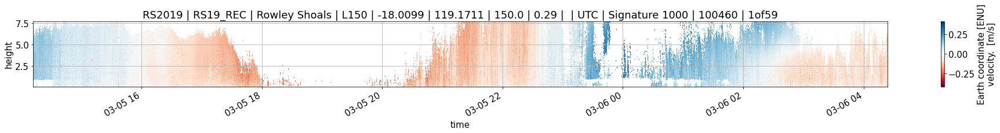

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


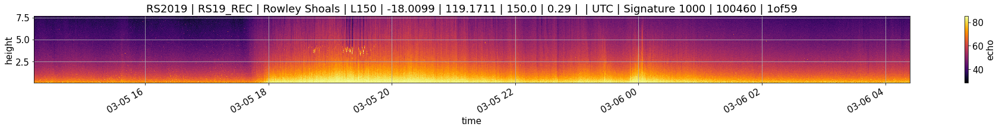

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_02.ad2cp
Reading 189616 ensembles [0-189616] from file  %s ...
File read, 13.167708305642009 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-06 04:23:59.063404
     Ends: 2019-03-06 17:34:02.859680
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source': '', 'project': 

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 226140375 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[2of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


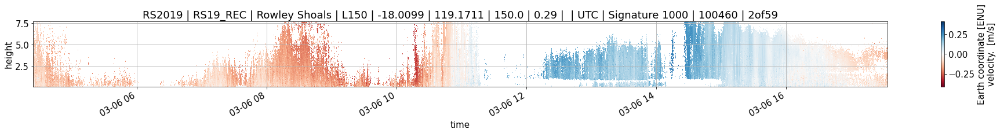

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


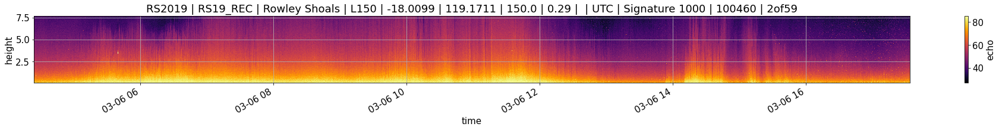

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_03.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861109256744 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-06 18:35:59.063304
     Ends: 2019-03-07 08:47:58.613617
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 216015495 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[3of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


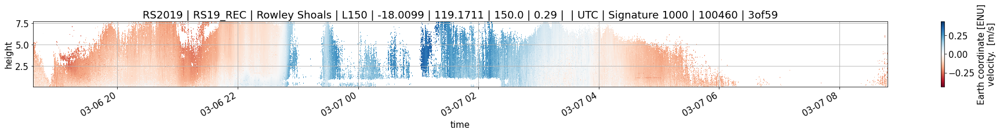

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


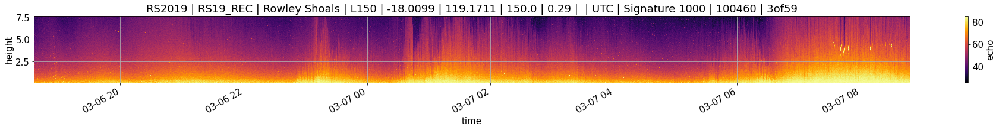

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_04.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861084111035 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-07 08:47:59.063395
     Ends: 2019-03-07 22:59:58.614023
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 190367640 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[4of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


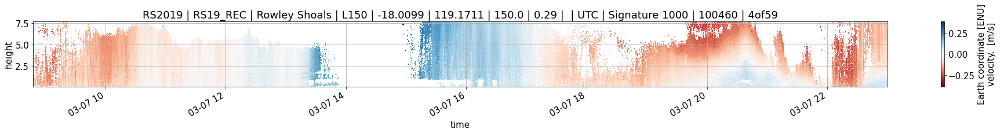

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


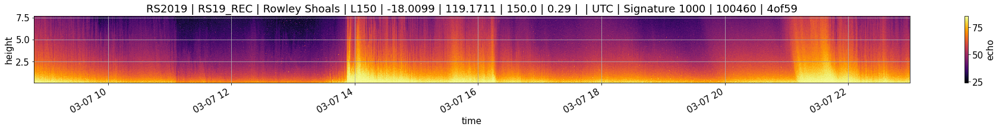

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_05.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861112050712 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-07 22:59:59.063295
     Ends: 2019-03-08 13:11:58.613142
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 233855605 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[5of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


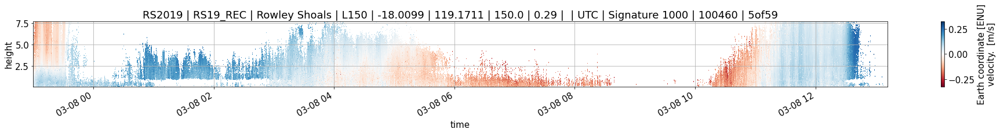

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


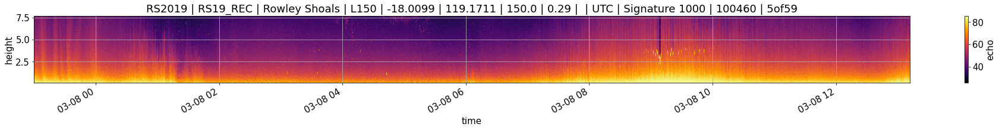

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_06.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861084111035 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-08 13:11:59.063296
     Ends: 2019-03-09 03:23:58.613292
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 235364715 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[6of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


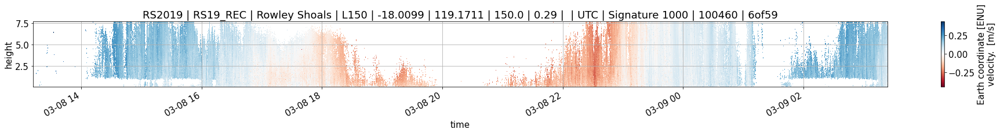

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


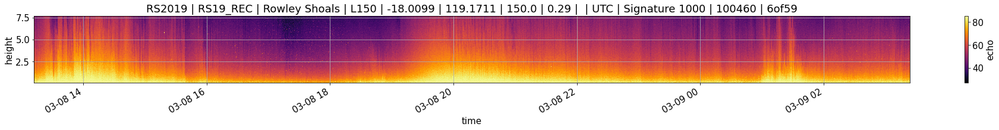

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_07.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861084111035 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-09 03:23:59.063397
     Ends: 2019-03-09 17:35:58.613498
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 245517830 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[7of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


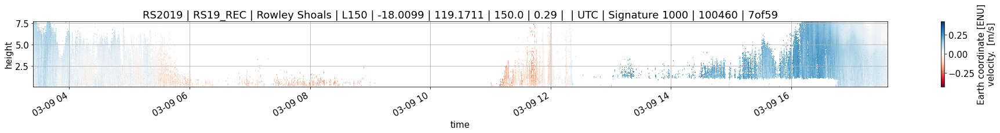

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


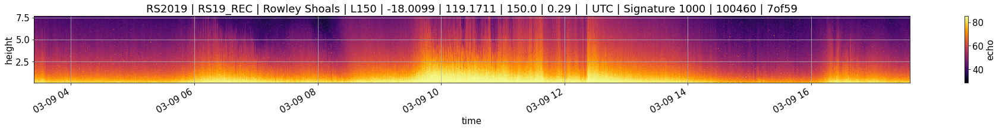

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_08.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861112050712 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-09 17:35:59.063298
     Ends: 2019-03-10 07:47:58.613136
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 242979985 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[8of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


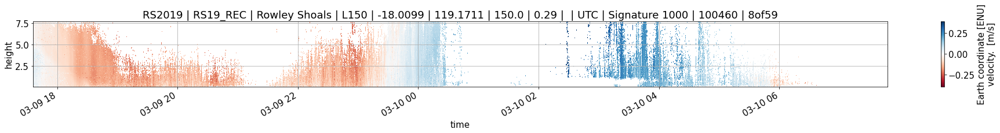

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


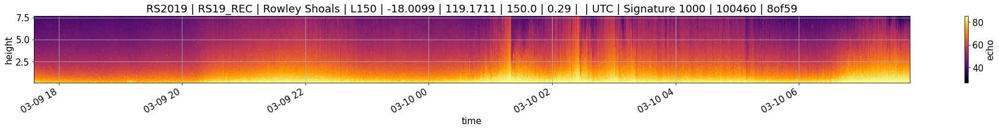

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_09.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861112050712 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-10 07:47:59.063298
     Ends: 2019-03-10 21:59:58.612541
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 236993450 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[9of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


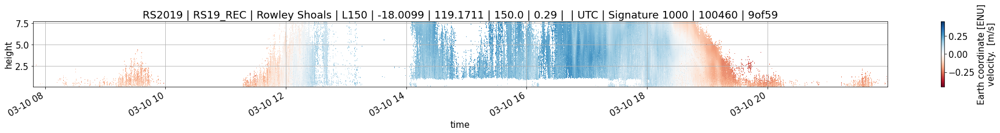

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


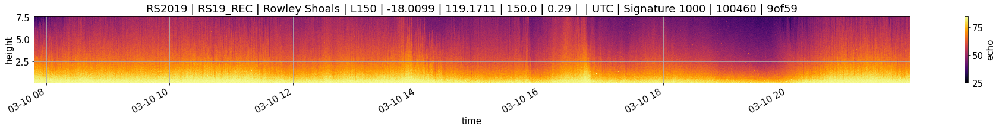

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_10.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861112050712 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-10 21:59:59.063299
     Ends: 2019-03-11 12:11:58.613039
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 240703660 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[10of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


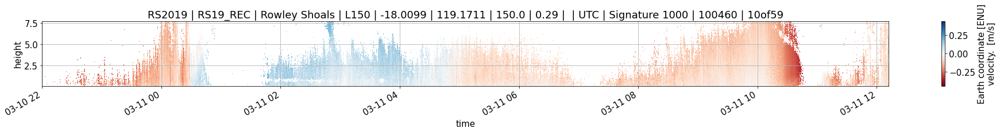

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


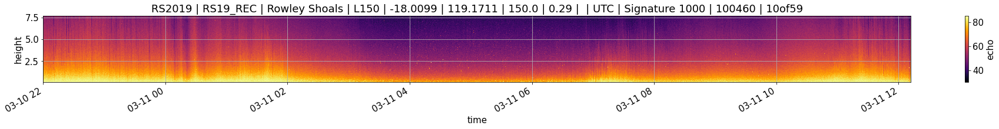

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_11.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861084111035 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-11 12:11:59.063400
     Ends: 2019-03-12 02:23:58.613434
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 237281805 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[11of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


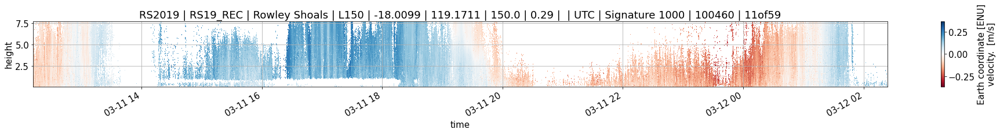

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


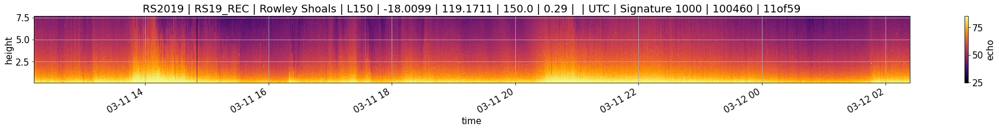

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_12.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861112050712 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-12 02:23:59.063300
     Ends: 2019-03-12 16:35:58.614119
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 229338095 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[12of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


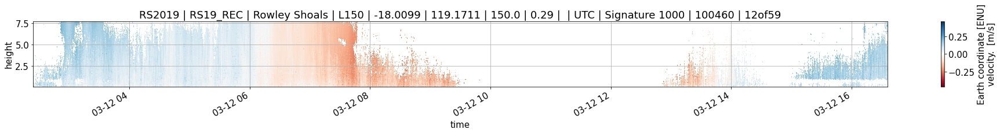

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


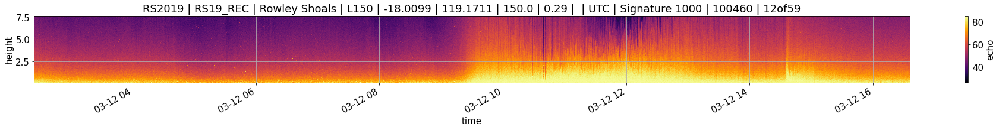

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_13.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...
File read, 14.199861084111035 hours in record.
Converting mpltime to date. Expect delays!
Converted.
     Starts: 2019-03-12 16:35:59.063401
     Ends: 2019-03-13 06:47:58.613724
     How were those delays?
Initialising accessor.
STORING RAW FILE ATTRIBUTES
CONFIG:SERIALNUM
CONFIG:SERIALNUM_B5
CONFIG:FS
CONFIG:BLANKING
CONFIG:BLANKING_B5
CONFIG:CELL_SIZE
CONFIG:CELL_SIZE_B5
CONFIG:COORD_SYS
CONFIG:COORD_SYS_B5
CONFIG:DATA_DESC
CONFIG:DATA_DESC_B5
CONFIG:MODEL
CONFIG:NBEAMS
CONFIG:NBEAMS_B5
CONFIG:NCELLS
CONFIG:NCELLS_B5
CONFIG:NOM_CORR
CONFIG:NOM_CORR_B5
CONFIG:POWER_LEVEL
CONFIG:POWER_LEVEL_B5
CONFIG:VEL_SCALE
CONFIG:VEL_SCALE_B5
CONFIG:TRANSMATRIX
CONFIG:HEAD:TRANSMATRIX_HOWTOTEADINNUMPY
{'title': '', 'institution': 'The University of Western Australia', 'institution_division': 'Ocean Dynamics', 'source

c:\users\azulberti\dropbox\university\phd\03_code\source_code\zutils\zutils\xrwrap.py:1067: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vals = array.values[expand_list]


Blanking 216931790 values.
Done.
E:\Experiments\rs19\archive_FV00\Signature 1000
Generating filename from naming convention.
Best export dir is the raw_file_directory.
Will to user input directory.
Exporting E:\Experiments\rs19\archive_FV00\Signature 1000//[RS2019]_[RS19_REC]_[L150]_[28]_[Signature 1000]_[100460]_[13of59].nc
Figure size is 69.0 x 8.0 cm
Blanking 0 values.
Blanking 0 values.


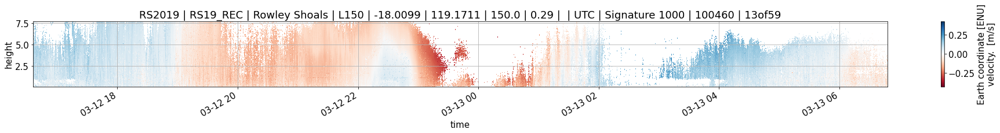

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


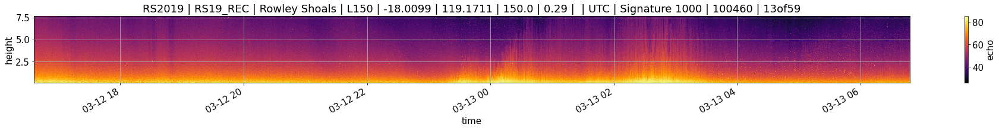

E:\Experiments\rs19\data/moored_instrument_data\raw_data\L150\Signature1000\100460\S100460A022_PIL19HR_14.ad2cp
Indexing... Done.
Reading 204479 ensembles [0-204479] from file  %s ...


In [ ]:
# # Apr-3 wave
# start = 50*30000+700000
# end   = 55*30000+750000

# nens=[start, end]
step = 400000
    
# signature = (fullpath, dat=None, nens=nens, hasb=hasb)
filetypes = ['Signature 1000'];
moorings = db_data['possible_mooring_dates']['Mooring'].values

dfd = r'G:\Experiments\kissme17\Data\FLNTU\Device Files'

for index, row in db_data['deployment_metadata'].iterrows():

    mooring = row['StationID']
    instrument = row['InstrumentType']
    sn = row['SerialNo']
    attributes = ai.row_to_attrs(row)
    
    if not mooring.lower() in moorings:
        print('Skipping ' + mooring)
        continue
        
#     if row['FileName'] == '60170*.VEC':
#         continue

    if instrument in filetypes:

        filename_wc = os.path.join(moored_data_root, row['FilePath'], row['FileName'])
        
        filenames = glob.glob(filename_wc)
        if len(filenames) == 0:
            print('Skipping ' + row['FileName'])
            continue
                        
        for filenum, filename in enumerate(filenames):
            
            if filenum == 0:
                continue
            
            st = 31
#             st = 8
            if False:
                for ii in np.arange(st, 1000): # Not very well thought out at the moment
                    nens = [(ii)*step, (ii+1)*step]

                    rr, ds = nortek_signature.from_ad2cp(filename, nens=nens)

                    rr.update_attributes_with_dict(attributes)

        #             rr.ds = rr.ds.assign_coords({'time': rr.ds.datetime.values})
                    rr.ds['echo'] = rr.ds['echo'].astype(float)
                    pqc.pimosInOutWaterQC(rr, mooring, db_data, experiment='rs2019', recovered='rs19_rec')
                    pqc.pimosTiltVelocitySimpleQC(rr, 10)
                    pqc.pimosEchoIntensitySimpleQC(rr, 29)
                    pqc.pimosCorrMagVelocitySetQC(rr, corr_name='corr', thresh_1= 85)

                    fn = str(sn)+'_['+str(nens[0])+'-'+str(nens[1])+']'
                    ai.pIMOS_export(rr, archive_dir, instrument, fn)

                    fig = ai.plot_temp(rr, db_data, mooring, attributes, variable='pressure',plotraw=True)
                    png_path = rr.fullpath_last_export[0:-3] +'.png'
                    fig.savefig(png_path, dpi=300)
            else:
                print(filename)
                rr, ds = nortek_signature.from_ad2cp(filename)
                
                # This will give each output file a unique name
                attributes['outfile_append'] = ('{}of{}'.format(filenum, len(filenames)))
                
                rr.update_attributes_with_dict(attributes)
                
                pqc.pimosInOutWaterQC(rr, mooring.lower(), db_data, experiment='rs2019', recovered='rs19_rec')
                pqc.pimosTiltVelocitySimpleQC(rr, 10)
                pqc.pimosEchoIntensitySimpleQC(rr, 29)
                pqc.pimosCorrMagVelocitySetQC(rr, corr_name='corr', thresh_1= 85)
                
                fn = str(sn)+'_[part{}]'.format(filenum)
                fn
                
                rr._calc_rotations()
                
                ai.pIMOS_export(rr, archive_dir, instrument, fn)
                
                fig = ai.plot_echo(rr, db_data, mooring, attributes, variable='vel_enu', cmap='RdBu')
                png_path = rr.fullpath_last_export[0:-3] +'ENU_1.png'
                fig.savefig(png_path, dpi=300)

                fig = ai.plot_echo(rr, db_data, mooring, attributes, cmap='inferno')
                png_path = rr.fullpath_last_export[0:-3] +'ECHO_1.png'
                fig.savefig(png_path, dpi=300)
                

Figure size is 69.0 x 8.0 cm
Blanking 98755200 values.
Blanking 98755200 values.


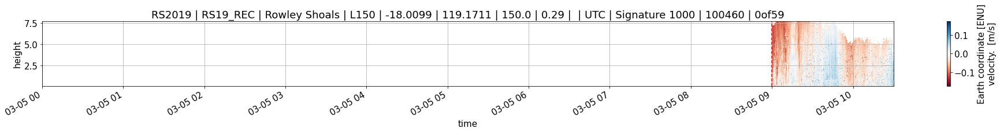

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


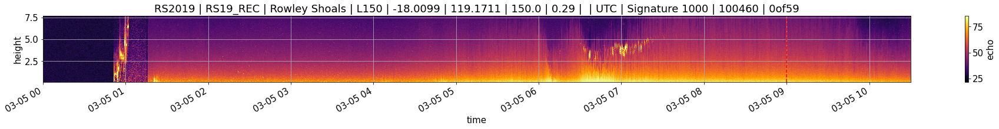

In [8]:
fig = ai.plot_echo(rr, db_data, mooring, attributes, variable='vel_enu', cmap='RdBu')
png_path = rr.fullpath_last_export[0:-3] +'ENU_1.png'
fig.savefig(png_path, dpi=300)

fig = ai.plot_echo(rr, db_data, mooring, attributes, cmap='inferno')
png_path = rr.fullpath_last_export[0:-3] +'ECHO_1.png'
fig.savefig(png_path, dpi=300)

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


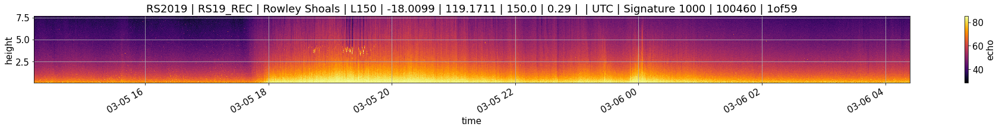

In [44]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='inferno')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


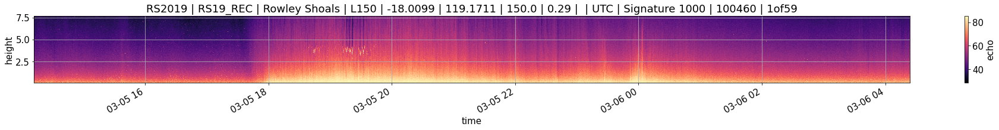

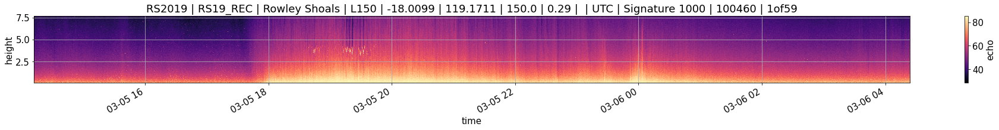

In [32]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='magma')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


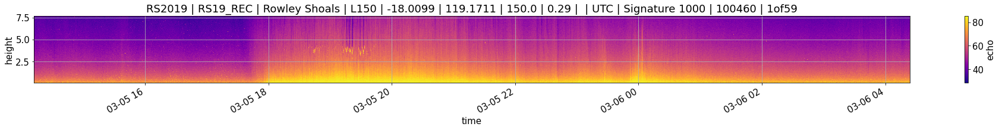

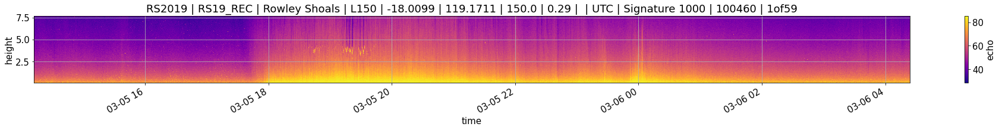

In [33]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='plasma')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


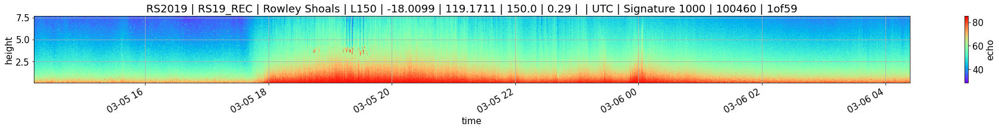

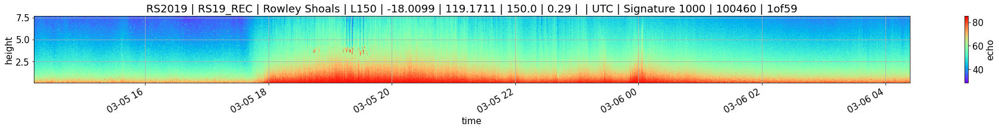

In [34]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='rainbow')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


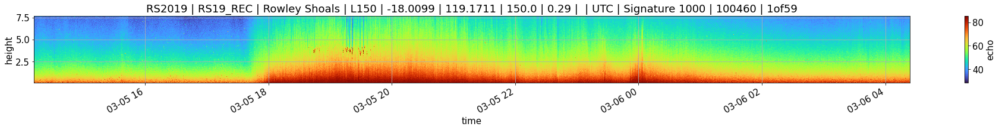

In [35]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='turbo')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


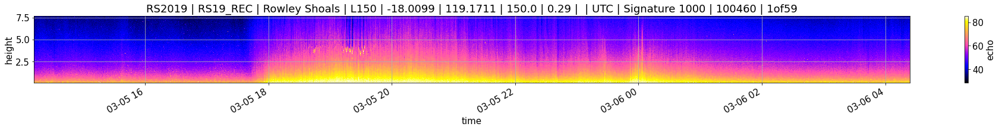

In [36]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='gnuplot2')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


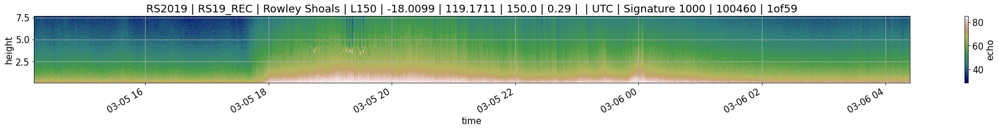

In [37]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='gist_earth')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


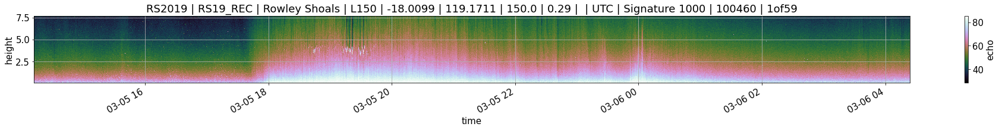

In [38]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='cubehelix')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


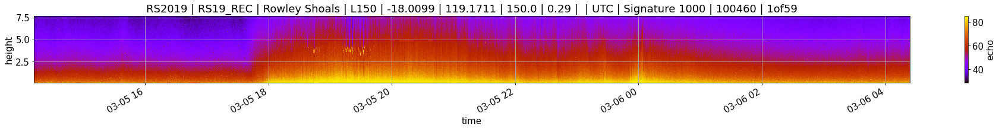

In [40]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='gnuplot')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


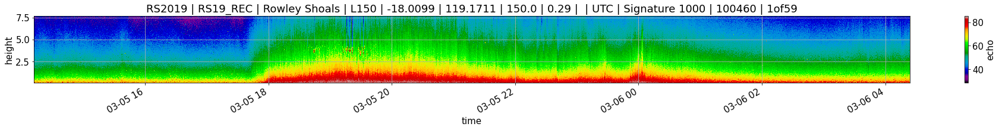

In [41]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='nipy_spectral')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


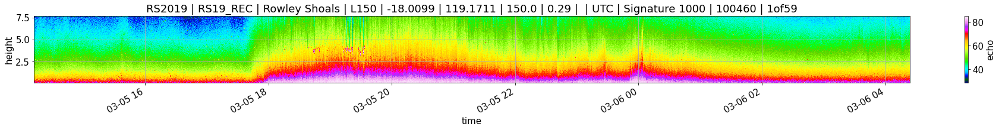

In [42]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='gist_ncar')

Figure size is 69.0 x 8.0 cm
Variable echo has no QAQC flag. Returning raw.
Variable echo has no QAQC flag. Returning raw.


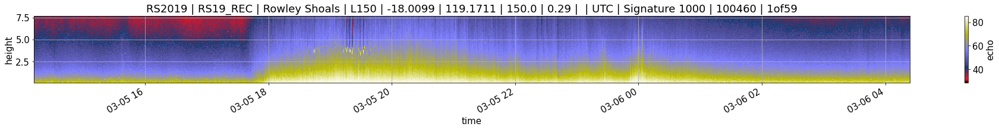

In [43]:
fig = plot_echo(rr, db_data, mooring, attributes, variable='echo', width=65, cmap='gist_stern')